In [ ]:
!pip install opencv-python
!pip install matplotlib

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 读取图像
image = cv2.imread('../../data/1/toothmesh.png', cv2.IMREAD_GRAYSCALE)
if image is None:
    print("Error loading image")
    exit()

# 显示结果
plt.imshow(image, cmap='gray')
plt.title("Origin Image")
plt.axis('off')
plt.show()
    
# 应用自适应阈值分割
adaptive_thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                    cv2.THRESH_BINARY_INV, 31, 1.5)

# 保存图像
cv2.imwrite('adaptive_thresh.png', adaptive_thresh)

# 显示结果
plt.imshow(adaptive_thresh, cmap='gray')
plt.title("Non kernel sharpening 31 - 1.5 adaptive_thresh Image")
plt.axis('off')
plt.show()

# 使用锐化
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1, 9,-1],
                              [-1,-1,-1]])
sharpened_image = cv2.filter2D(image, -1, kernel_sharpening)

# 应用自适应阈值分割
adaptive_thresh = cv2.adaptiveThreshold(sharpened_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                    cv2.THRESH_BINARY_INV, 31, 1.5)
# 显示结果
plt.imshow(adaptive_thresh, cmap='gray')
plt.title("Kernel sharpening 31 - 1.5 adaptive_thresh Image")
plt.axis('off')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../../data/1/toothmesh.png'

In [8]:
!pip install nibabel

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 3.3/3.3 MB 5.4 MB/s eta 0:00:00


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [ ]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# 加载NIfTI文件
nii_file = 'ct.nii'
img = nib.load(nii_file)
data = img.get_fdata()

# 执行最大强度投影（MIP）
depth_map = np.max(data, axis=2)  # 假设数据的布局是(X, Y, S)，调整axis根据实际情况

# 显示深度图
plt.imshow(depth_map, cmap='gray')
plt.colorbar()
plt.title('Depth Map by Maximum Intensity Projection')
plt.show()

In [9]:
!pip install Pillow


Defaulting to user installation because normal site-packages is not writeable


In [11]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 加载NIfTI文件
nii_file = 'ct.nii'
img = nib.load(nii_file)
data = img.get_fdata()

# 确定保存图像的文件夹
output_folder = 'output_images/'

# 遍历每一层并保存为图像
num_slices = data.shape[2]  # 假设层是在第三个维度
for i in range(num_slices):
    slice_data = data[:, :, i]  # 提取一层
    
    # 使用matplotlib创建图像并保存（可选的方式）
    plt.imshow(slice_data, cmap='gray')
    plt.axis('off')  # 关闭坐标轴
    plt.savefig(f'{output_folder}slice_{i}.png', bbox_inches='tight', pad_inches=0)
    plt.close()

    # 或者使用Pillow直接保存为灰度图
    img_pil = Image.fromarray(np.uint8(slice_data))  # 转换为8位无符号整数
    img_pil.save(f'{output_folder}slice_{i}_pil.png')

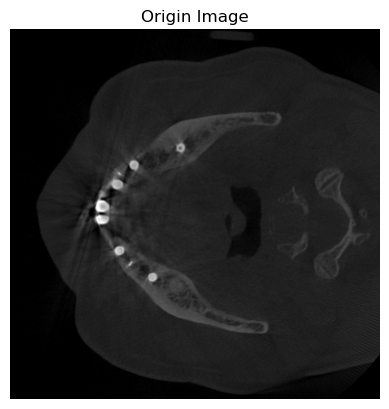

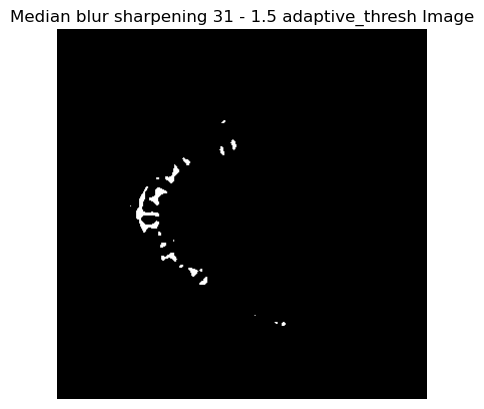

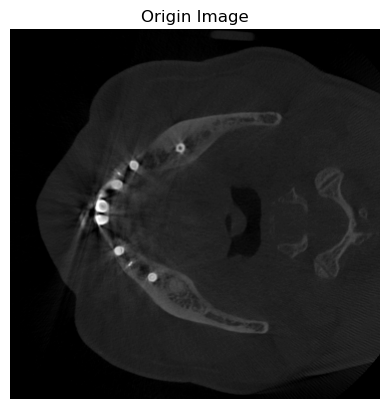

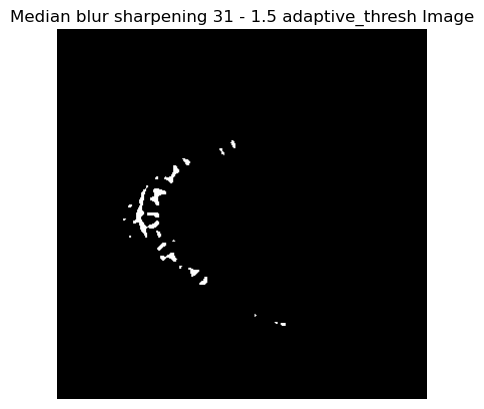

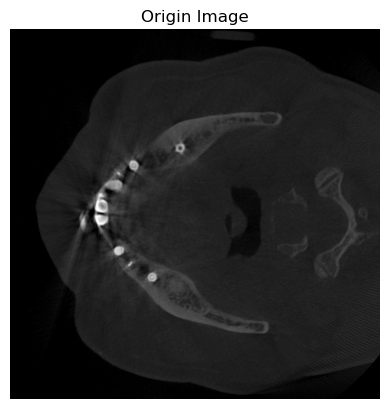

...

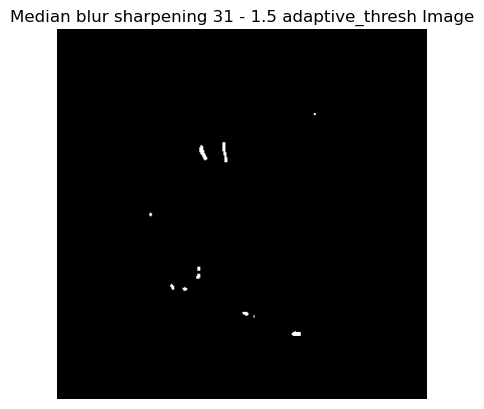

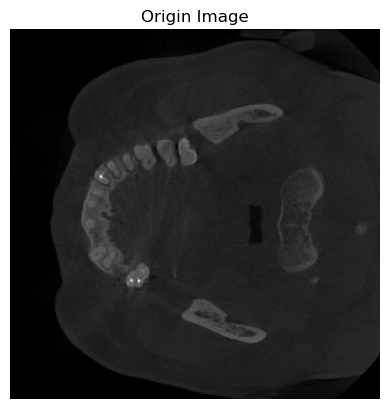

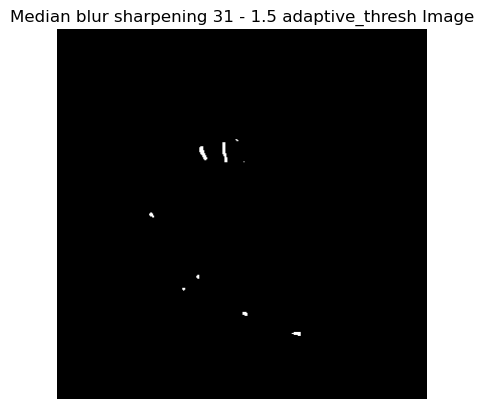

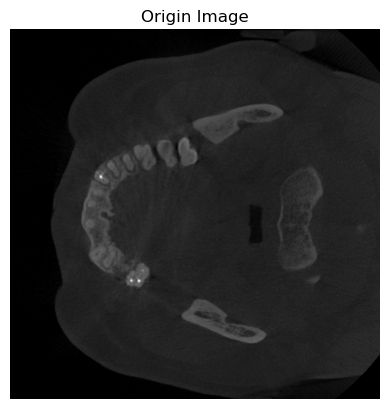

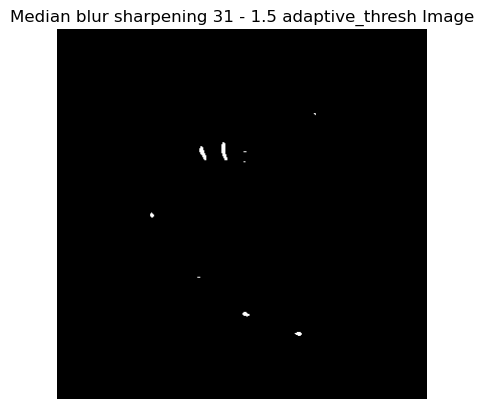

KeyboardInterrupt: 

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


for i in range(158, 272):
    # 读取图像
    image = cv2.imread('output_images/slice_{}.png'.format(i), cv2.IMREAD_GRAYSCALE)
    if image is None:
        print("Error loading image")
        exit()

    # 显示结果
    plt.imshow(image, cmap='gray')
    plt.title("Origin Image")
    plt.axis('off')
    plt.show()

    # 应用自适应阈值分割
    adaptive_thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                        cv2.THRESH_BINARY_INV, 11,15)
    # 应用中值滤波
    median = cv2.medianBlur(adaptive_thresh, 5)
    
        # 显示结果
    plt.imshow(median, cmap='gray')
    plt.title("Median blur sharpening 31 - 1.5 adaptive_thresh Image")
    plt.axis('off')
    plt.show()
    

In [4]:
from ultralytics import YOLO

# Create a new YOLO model from scratch
model = YOLO('yolov8n.yaml')

# Load a pretrained YOLO model (recommended for training)
model = YOLO('yolov8n.pt')

# Train the model using the 'coco8.yaml' dataset for 3 epochs
results = model.train(data='count_teeth.yaml', epochs=100)

# Evaluate the model's performance on the validation set
results = model.val()


New https://pypi.org/project/ultralytics/8.2.15 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.12  Python-3.9.19 torch-2.3.0+cpu CPU (13th Gen Intel Core(TM) i9-13900HX)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=count_teeth.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_fr

train: Scanning D:\Code\VisualLabExperiment\src\Python\datasets\count_teeth\labels\train... 54 images, 0 backgrounds, 0

train: New cache created: D:\Code\VisualLabExperiment\src\Python\datasets\count_teeth\labels\train.cache



val: Scanning D:\Code\VisualLabExperiment\src\Python\datasets\count_teeth\labels\val... 15 images, 0 backgrounds, 0 cor

val: New cache created: D:\Code\VisualLabExperiment\src\Python\datasets\count_teeth\labels\val.cache
Plotting labels to runs\detect\train9\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train9
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G     0.9854      3.193       1.18         82        640: 100%|██████████| 4/4 [00:06<00:00,  1.61
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105     0.0218      0.933     0.0358     0.0265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G     0.7722      2.583      1.012         74        640: 100%|██████████| 4/4 [00:04<00:00,  1.22
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105     0.0233          1      0.322      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      0.683      1.503     0.9372         56        640: 100%|██████████| 4/4 [00:05<00:00,  1.27
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.271      0.538      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      0.596     0.8734     0.9128         54        640: 100%|██████████| 4/4 [00:05<00:00,  1.25
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.478      0.936      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G     0.6307     0.7738      0.939         51        640: 100%|██████████| 4/4 [00:04<00:00,  1.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.524      0.984       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G     0.6295     0.7258     0.9498         61        640: 100%|██████████| 4/4 [00:04<00:00,  1.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.654      0.979      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G     0.5667     0.6865     0.9055         52        640: 100%|██████████| 4/4 [00:04<00:00,  1.19
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.679       0.96      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G     0.6114     0.6931     0.9199         61        640: 100%|██████████| 4/4 [00:04<00:00,  1.19
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.95      0.724      0.954      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G     0.5699     0.6378     0.8946         70        640: 100%|██████████| 4/4 [00:04<00:00,  1.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98      0.932       0.99      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G     0.5538     0.6316     0.8901         67        640: 100%|██████████| 4/4 [00:04<00:00,  1.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.979      0.908      0.992      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G     0.5889     0.6233     0.9306         66        640: 100%|██████████| 4/4 [00:04<00:00,  1.19
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.904      0.994      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G     0.5389     0.6007      0.913         73        640: 100%|██████████| 4/4 [00:04<00:00,  1.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.935      0.995      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G     0.5677     0.5962     0.9038         86        640: 100%|██████████| 4/4 [00:04<00:00,  1.21
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99       0.96      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.5833     0.6142     0.9314         88        640: 100%|██████████| 4/4 [00:04<00:00,  1.24
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98       0.99      0.995      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.5411      0.581     0.9111         58        640: 100%|██████████| 4/4 [00:04<00:00,  1.22
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.996      0.995      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.4833     0.5646     0.8951         50        640: 100%|██████████| 4/4 [00:04<00:00,  1.22
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.973          1      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.5245     0.5595     0.8991         53        640: 100%|██████████| 4/4 [00:04<00:00,  1.24
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.97          1      0.993      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.4963     0.5312     0.8961         54        640: 100%|██████████| 4/4 [00:04<00:00,  1.22
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.985       0.99      0.995      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.5014     0.5494      0.894         43        640: 100%|██████████| 4/4 [00:04<00:00,  1.21
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99      0.982      0.995       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      0.501     0.5092     0.9037         59        640: 100%|██████████| 4/4 [00:04<00:00,  1.25
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.981      0.983      0.995      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G     0.4828     0.5222     0.9012         64        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.999       0.99      0.995      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.4874     0.5258     0.8887         65        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.999       0.99      0.995      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.5026     0.5224     0.8906         60        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.979       0.99      0.995      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G     0.5396     0.5554     0.9052        109        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.987       0.99      0.995      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G     0.5052     0.4947     0.8939         68        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99      0.988      0.995      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.5289      0.542      0.924         40        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.981      0.979      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.4944     0.5051     0.8906         76        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.976      0.981      0.992      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.5413     0.5047     0.9148         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.972      0.987       0.99      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G     0.4861     0.4809     0.8733         55        640: 100%|██████████| 4/4 [00:05<00:00,  1.45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.981      0.979      0.991      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.5295     0.4852       0.88         84        640: 100%|██████████| 4/4 [00:05<00:00,  1.43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989      0.971      0.993      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.4851     0.4653      0.889         68        640: 100%|██████████| 4/4 [00:05<00:00,  1.46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.984      0.981      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.4929     0.4937      0.894         97        640: 100%|██████████| 4/4 [00:05<00:00,  1.45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.998      0.995      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G     0.5205     0.4816     0.9031         48        640: 100%|██████████| 4/4 [00:05<00:00,  1.44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991          1      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.4735     0.4704     0.8882         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.981          1      0.995      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.4908     0.4598      0.899         59        640: 100%|██████████| 4/4 [00:05<00:00,  1.44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.981          1      0.995      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.4707     0.4499     0.8924         46        640: 100%|██████████| 4/4 [00:05<00:00,  1.42
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98          1      0.995      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G     0.4731     0.4463     0.8893         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.989      0.995      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.5053     0.4514     0.9227         68        640: 100%|██████████| 4/4 [00:06<00:00,  1.51
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1          1      0.995      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      0.425     0.4257     0.8803         59        640: 100%|██████████| 4/4 [00:06<00:00,  1.54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.999      0.995      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      0.474     0.4397     0.8936         60        640: 100%|██████████| 4/4 [00:06<00:00,  1.58
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.998      0.995      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.4831     0.4547     0.9087         46        640: 100%|██████████| 4/4 [00:05<00:00,  1.44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.999          1      0.995      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.4587     0.4185     0.8813         64        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991          1      0.995       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.4555     0.4175     0.8763         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.997          1      0.995      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.4531     0.4193      0.881         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.996          1      0.995      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.4266     0.4095     0.8879         49        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.998          1      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.4103     0.3897      0.865         67        640: 100%|██████████| 4/4 [00:05<00:00,  1.43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.993          1      0.995      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.4665     0.4295     0.8909         86        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.4099     0.3909     0.8645         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.42
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.4014     0.3945     0.8638         70        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.999      0.995      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.4406     0.4087     0.8778         65        640: 100%|██████████| 4/4 [00:05<00:00,  1.44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.995          1      0.995      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.4026      0.397     0.8609         60        640: 100%|██████████| 4/4 [00:05<00:00,  1.45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.4255     0.3955     0.8893         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.4299     0.3875     0.8746         89        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.4344     0.3934     0.8876         59        640: 100%|██████████| 4/4 [00:05<00:00,  1.44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991          1      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.4139     0.3803     0.8577         76        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.4104     0.3837     0.8891         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.4006      0.374     0.8624         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.993          1      0.995      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.3961     0.3651     0.8676         56        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105          1      0.999      0.995      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.4044     0.3694     0.8541         62        640: 100%|██████████| 4/4 [00:05<00:00,  1.37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.3827     0.3782     0.8661         56        640: 100%|██████████| 4/4 [00:05<00:00,  1.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.4084     0.3924     0.8923         74        640: 100%|██████████| 4/4 [00:05<00:00,  1.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G     0.3994     0.3928     0.8701        106        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.4013      0.367     0.8666         67        640: 100%|██████████| 4/4 [00:05<00:00,  1.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.3824     0.3534     0.8629         65        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.3662     0.3537     0.8567         92        640: 100%|██████████| 4/4 [00:05<00:00,  1.37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.994      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G       0.34      0.332     0.8499         58        640: 100%|██████████| 4/4 [00:05<00:00,  1.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.994       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.3492     0.3305     0.8387         60        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G     0.3544     0.3406     0.8622         74        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.3547     0.3382     0.8557         65        640: 100%|██████████| 4/4 [00:05<00:00,  1.36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.3583     0.3415     0.8596         46        640: 100%|██████████| 4/4 [00:05<00:00,  1.36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.3541     0.3358     0.8523         75        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.3812      0.343     0.8792         66        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.3761     0.3567     0.8687         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.3764     0.3462     0.8472         40        640: 100%|██████████| 4/4 [00:05<00:00,  1.43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.3679     0.3692     0.8701         99        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.3756     0.3393     0.8562         64        640: 100%|██████████| 4/4 [00:05<00:00,  1.35
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.3693     0.3406     0.8566         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.3525     0.3288     0.8576         73        640: 100%|██████████| 4/4 [00:05<00:00,  1.45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.3445     0.3287     0.8456         78        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.3533     0.3328     0.8515         69        640: 100%|██████████| 4/4 [00:05<00:00,  1.42
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.3439      0.321     0.8675         47        640: 100%|██████████| 4/4 [00:05<00:00,  1.50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.989          1      0.995      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.3453     0.3208     0.8592         42        640: 100%|██████████| 4/4 [00:06<00:00,  1.54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.998      0.995      0.945



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.3348      0.308      0.838         55        640: 100%|██████████| 4/4 [00:05<00:00,  1.50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98          1      0.995      0.937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G     0.3709     0.3333     0.8583         69        640: 100%|██████████| 4/4 [00:06<00:00,  1.55
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98          1      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.3559     0.3181     0.8539         50        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.98          1      0.995      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G     0.3386     0.3213     0.8704         88        640: 100%|██████████| 4/4 [00:05<00:00,  1.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.979          1      0.995      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.3482       0.32     0.8535         93        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.998      0.995      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.3441      0.331     0.8576         96        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99          1      0.995      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.3376      0.316     0.8668         58        640: 100%|██████████| 4/4 [00:05<00:00,  1.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991          1      0.995      0.939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.3406     0.3103     0.8649         50        640: 100%|██████████| 4/4 [00:05<00:00,  1.40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.994      0.995      0.937


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.3076     0.3105     0.8227         39        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.994      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.3036      0.301     0.8125         42        640: 100%|██████████| 4/4 [00:05<00:00,  1.35
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.996      0.995      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.2885     0.2946     0.8253         41        640: 100%|██████████| 4/4 [00:05<00:00,  1.36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.996      0.995      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G     0.2924      0.304     0.8176         40        640: 100%|██████████| 4/4 [00:05<00:00,  1.35
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.997      0.995      0.951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G      0.292     0.2981     0.8213         39        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.997      0.995      0.948



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.3111     0.3211     0.8403         40        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.997      0.995      0.947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.2759     0.2899     0.8112         42        640: 100%|██████████| 4/4 [00:05<00:00,  1.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99       0.99      0.995      0.943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.2733      0.289     0.8131         38        640: 100%|██████████| 4/4 [00:05<00:00,  1.37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105       0.99       0.99      0.995      0.939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.2845     0.2932     0.8151         42        640: 100%|██████████| 4/4 [00:05<00:00,  1.37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.996      0.995      0.939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.2734     0.2873     0.8271         39        640: 100%|██████████| 4/4 [00:05<00:00,  1.36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0

                   all         15        105      0.991      0.997      0.995       0.94



100 epochs completed in 0.186 hours.
Optimizer stripped from runs\detect\train9\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\train9\weights\best.pt, 6.3MB

Validating runs\detect\train9\weights\best.pt...
Ultralytics YOLOv8.2.12  Python-3.9.19 torch-2.3.0+cpu CPU (13th Gen Intel Core(TM) i9-13900HX)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0


                   all         15        105      0.991      0.997      0.995      0.951
Speed: 0.7ms preprocess, 25.5ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs\detect\train9
Ultralytics YOLOv8.2.12  Python-3.9.19 torch-2.3.0+cpu CPU (13th Gen Intel Core(TM) i9-13900HX)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning D:\Code\VisualLabExperiment\src\Python\datasets\count_teeth\labels\val.cache... 15 images, 0 backgrounds,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0


                   all         15        105      0.991      0.997      0.995      0.951
Speed: 0.6ms preprocess, 25.0ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs\detect\train92


(2048, 2048)


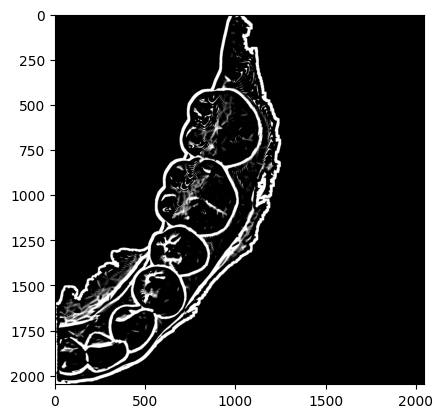

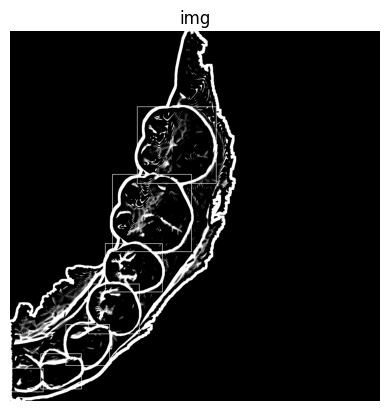

In [19]:
import cv2
import matplotlib.pyplot as plt

def read_labels(label_path, img_shape):
    boxes = []
    with open(label_path, 'r') as file:
        for line in file:
            class_id, x_center_norm, y_center_norm, width_norm, height_norm = map(float, line.split())
            x_center = x_center_norm * img_shape[1]
            y_center = y_center_norm * img_shape[0]
            width = width_norm * img_shape[1]
            height = height_norm * img_shape[0]
            x_min = int(x_center - width / 2)
            y_min = int(y_center - height / 2)
            x_max = int(x_center + width / 2)
            y_max = int(y_center + height / 2)
            boxes.append((class_id, x_min, y_min, x_max, y_max))
    return boxes

def draw_boxes(img, boxes):
    for box in boxes:
        class_id, x_min, y_min, x_max, y_max = box
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)  # Blue color, 2px thickness




# 主要流程
image_path = './Sample_077_d.png'
label_path = './Sample_077_d.txt'

# 读取图片
img = cv2.imread(image_path,cv2.IMREAD_GRAYSCALE)
print(img.shape)
plt.imshow(img, cmap='gray')
plt.show()


if img is None:
    raise ValueError("The image path is incorrect or the image is not accessible")

# 读取标签
boxes = read_labels(label_path, img.shape)

# 在图片上绘制边界框
draw_boxes(img, boxes)

# 使用 matplotlib 显示图片
plt.imshow(img, cmap='gray')
plt.title("img")
plt.axis('off')
plt.show()

In [7]:
%matplotlib inline

In [42]:
!pip install ultralytics

Defaulting to user installation because normal site-packages is not writeable


In [8]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2

from ultralytics import YOLO

model = YOLO("D:/Code/VisualLabExperiment/src/Python/runs/detect/train3/weights/best.pt")  # Load a YOLOv8 model using the Ultralytics Python API

# # 载入模型
# model = torch.hub.load('D:/Code/VisualLabExperiment/src/Python/runs/detect/train3/weights/', 'custom',
#         path='best.pt', source='local')

# 函数：加载图像
def load_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # 直接以灰度模式读取
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # 将单通道灰度图转换为三通道
    return img

# 函数：绘制预测框
def plot_predictions(img, preds):
    plt.imshow(img)
    ax = plt.gca()
    for pred in preds:
        x, y, w, h = pred['bbox']
        rect = plt.Rectangle((x, y), w, h, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)
        label = f"{pred['label']} {pred['confidence']:.2f}"
        ax.text(x, y, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
    plt.show()

# 预测图像
def predict_image(img_path):
    img = load_image(img_path)
    results = model(img)
    print(type(results))
    print(results)
    preds = results.pandas().xyxy[0].to_dict(orient="records")  # 转换为易于处理的格式
    plot_predictions(img, preds)


image_path = 'D:/Code/VisualLabExperiment/src/Python/test_img/Sample_079_d.png'
predict_image(image_path)


0: 640x640 (no detections), 42.4ms
Speed: 4.8ms preprocess, 42.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
<class 'list'>
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'tooth'}
obb: None
orig_img: array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

   

AttributeError: 'list' object has no attribute 'pandas'

In [5]:
!pip install pandas

In [12]:
# Render the results on the image
rendered_img = results.render()  # This returns a list of images (in case there are multiple images)

# Since we have only one image, we take the first element
rendered_img = rendered_img[0]

# Convert the rendered image from BGR (OpenCV format) to RGB (matplotlib format)
rendered_img_rgb = cv2.cvtColor(rendered_img, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(rendered_img_rgb)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()

# Save the image
cv2.imwrite('D:/Code/VisualLabExperiment/src/Python/detected_output.png', rendered_img)

AttributeError: 'list' object has no attribute 'render'

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

for i in results:
    
    # Load the original image from the Results object
    img = i.orig_img.copy()
    
    # Access the bounding boxes, labels, and scores
    boxes = i.boxes.xyxy[0]  # Assuming you have one batch. This gives you a tensor of shape [num_boxes, 6]
    
    # Draw each box
    for box in boxes:
        x1, y1, x2, y2, confidence, class_idx = box
        label = i.names[int(class_idx)]
        label_with_conf = f'{label} {confidence:.2f}'
    
        # Convert coordinates to integer
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
    
        # Draw rectangle
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
        # Put label on the rectangle
        cv2.putText(img, label_with_conf, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    # Display the image using matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()
    
    # Optionally, save the image
    cv2.imwrite('path_to_save_image.png', img)

TypeError: iteration over a 0-d tensor


image 1/1 D:\Code\VisualLabExperiment\src\Python\Sample_02_d.png: 640x640 7 tooths, 42.4ms
Speed: 2.6ms preprocess, 42.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


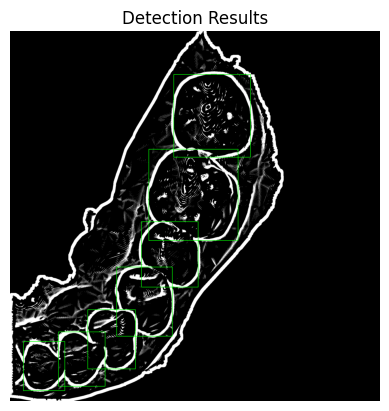

In [39]:


# Image
img = './Sample_02_d.png'
# Inference
results = model(img)

# Loop through each result in your results list
for result in results:
    # Assuming 'result.orig_img' is a numpy array; convert if needed
    img = result.orig_img.copy()
    # if isinstance(img, torch.Tensor):  # Convert if the image is a tensor
    #     img = img.numpy()
    #     if img.dtype != np.uint8:
    #         img = (img * 255).astype(np.uint8)
    
    # Get the bounding box data from the 'boxes' attribute of the result
    boxes = result.boxes.xyxy

    # Loop through each box and draw it on the image
    for box in boxes:
        # Ensure box is a numpy array for easy handling
        if isinstance(box, torch.Tensor):
            box = box.numpy()  # Convert tensor to numpy array if necessary
        
        x1, y1 = int(box[0]), int(box[1])
        x2, y2 = int(box[2]), int(box[3])
        
        # Draw rectangle on the image
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Convert BGR to RGB for displaying with matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Display the image with bounding boxes
    plt.imshow(img_rgb)
    plt.title("Detection Results")
    plt.axis('off')
    plt.show()

In [8]:
import os

def find_png_files(directory):
    """查找指定目录及其子目录下所有的.png文件"""
    png_files = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.png'):
                png_files.append(os.path.join(root, file))
    return png_files

# 指定要搜索的目录
directory_path = 'test_img'
png_files = find_png_files(directory_path)
print(png_files)

for img_path in png_files:
    # Image
    # Inference
    results = model(img_path)
    
    # Loop through each result in your results list
    for result in results:
        # Assuming 'result.orig_img' is a numpy array; convert if needed
        img = result.orig_img.copy()
        # if isinstance(img, torch.Tensor):  # Convert if the image is a tensor
        #     img = img.numpy()
        #     if img.dtype != np.uint8:
        #         img = (img * 255).astype(np.uint8)
        
        # Get the bounding box data from the 'boxes' attribute of the result
        boxes = result.boxes.xyxy
    
        # Loop through each box and draw it on the image
        for box in boxes:
            # Ensure box is a numpy array for easy handling
            if isinstance(box, torch.Tensor):
                box = box.numpy()  # Convert tensor to numpy array if necessary
            
            x1, y1 = int(box[0]), int(box[1])
            x2, y2 = int(box[2]), int(box[3])
            
            # Draw rectangle on the image
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
        # Convert BGR to RGB for displaying with matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Display the image with bounding boxes
        plt.imshow(img_rgb)
        plt.title("Detection Results")
        plt.axis('off')
        plt.show()

['test_img\\100.png', 'test_img\\101.png', 'test_img\\102.png', 'test_img\\103.png', 'test_img\\104.png', 'test_img\\105.png', 'test_img\\107.png', 'test_img\\108.png', 'test_img\\110.png', 'test_img\\112.png', 'test_img\\113.png', 'test_img\\114.png', 'test_img\\115.png', 'test_img\\116.png', 'test_img\\117.png', 'test_img\\118.png', 'test_img\\119.png', 'test_img\\120.png', 'test_img\\121.png', 'test_img\\123.png', 'test_img\\124.png', 'test_img\\125.png', 'test_img\\126.png', 'test_img\\127.png', 'test_img\\128.png', 'test_img\\129.png', 'test_img\\130.png', 'test_img\\131.png', 'test_img\\132.png', 'test_img\\133.png', 'test_img\\134.png', 'test_img\\135.png', 'test_img\\136.png', 'test_img\\137.png', 'test_img\\138.png', 'test_img\\139.png', 'test_img\\140.png', 'test_img\\141.png', 'test_img\\142.png', 'test_img\\143.png', 'test_img\\144.png', 'test_img\\145.png', 'test_img\\146.png', 'test_img\\91.png', 'test_img\\92.png', 'test_img\\93.png', 'test_img\\94.png', 'test_img\\95.pn

NameError: name 'model' is not defined

['test_img\\100.png', 'test_img\\101.png', 'test_img\\102.png', 'test_img\\103.png', 'test_img\\104.png', 'test_img\\105.png', 'test_img\\107.png', 'test_img\\108.png', 'test_img\\110.png', 'test_img\\112.png', 'test_img\\113.png', 'test_img\\114.png', 'test_img\\115.png', 'test_img\\116.png', 'test_img\\117.png', 'test_img\\118.png', 'test_img\\119.png', 'test_img\\120.png', 'test_img\\121.png', 'test_img\\123.png', 'test_img\\124.png', 'test_img\\125.png', 'test_img\\126.png', 'test_img\\127.png', 'test_img\\128.png', 'test_img\\129.png', 'test_img\\130.png', 'test_img\\131.png', 'test_img\\132.png', 'test_img\\133.png', 'test_img\\134.png', 'test_img\\135.png', 'test_img\\136.png', 'test_img\\137.png', 'test_img\\138.png', 'test_img\\139.png', 'test_img\\140.png', 'test_img\\141.png', 'test_img\\142.png', 'test_img\\143.png', 'test_img\\144.png', 'test_img\\145.png', 'test_img\\146.png', 'test_img\\91.png', 'test_img\\92.png', 'test_img\\93.png', 'test_img\\94.png', 'test_img\\95.pn

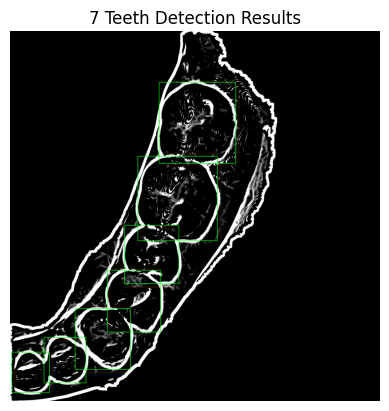


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\101.png: 640x640 7 tooths, 42.8ms
Speed: 3.0ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 101


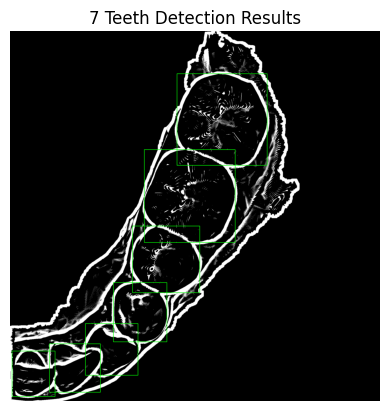


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\102.png: 640x640 8 tooths, 39.0ms
Speed: 2.3ms preprocess, 39.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 102


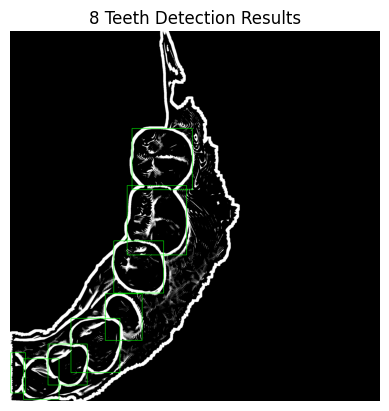


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\103.png: 640x640 7 tooths, 47.5ms
Speed: 3.0ms preprocess, 47.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Processing 103


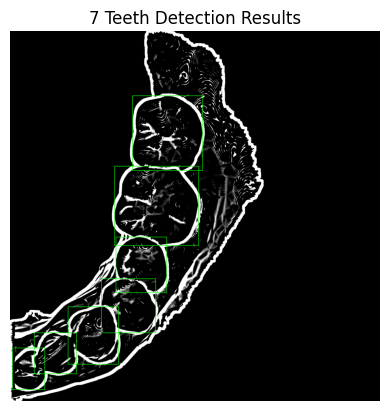


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\104.png: 640x640 7 tooths, 41.5ms
Speed: 2.6ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 104


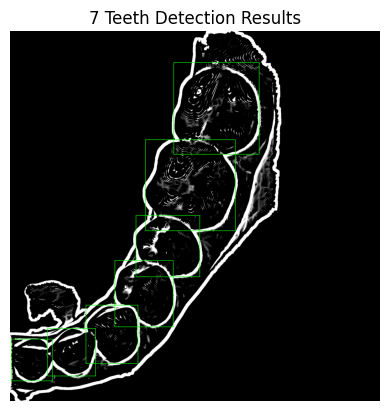


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\105.png: 640x640 7 tooths, 41.4ms
Speed: 2.5ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 105


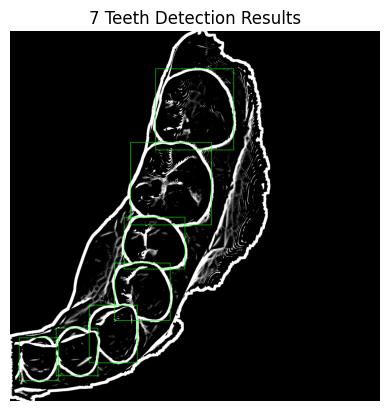


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\107.png: 640x640 8 tooths, 42.3ms
Speed: 3.0ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 107


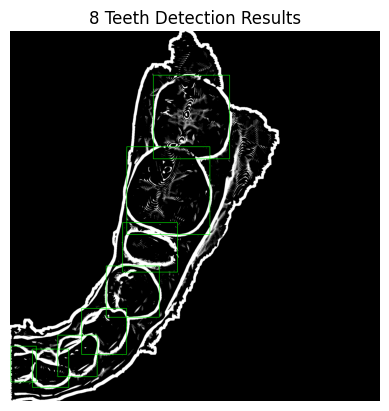


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\108.png: 640x640 7 tooths, 38.7ms
Speed: 2.5ms preprocess, 38.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Processing 108


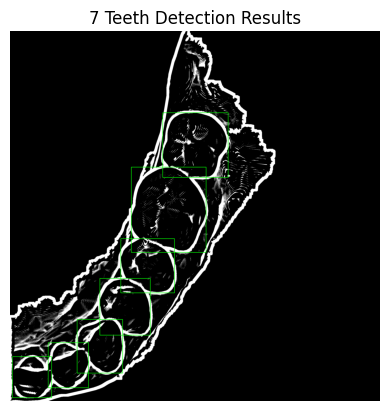


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\110.png: 640x640 7 tooths, 39.0ms
Speed: 3.0ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 110


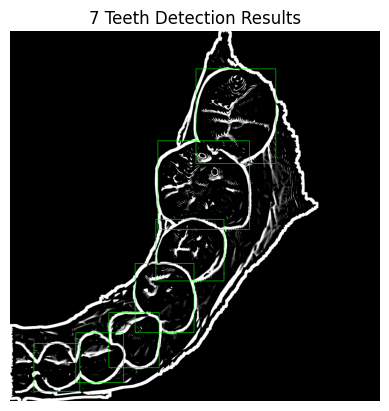


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\112.png: 640x640 7 tooths, 38.0ms
Speed: 3.0ms preprocess, 38.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 112


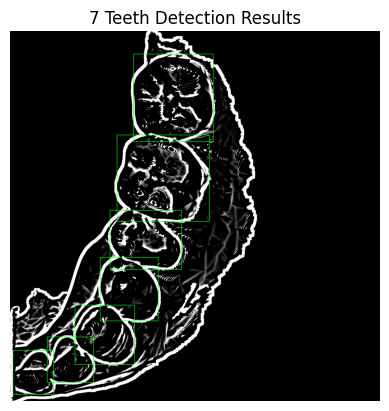


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\113.png: 640x640 7 tooths, 37.4ms
Speed: 3.0ms preprocess, 37.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 113


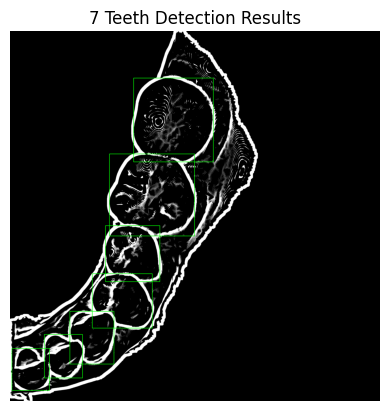


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\114.png: 640x640 7 tooths, 39.5ms
Speed: 2.6ms preprocess, 39.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Processing 114


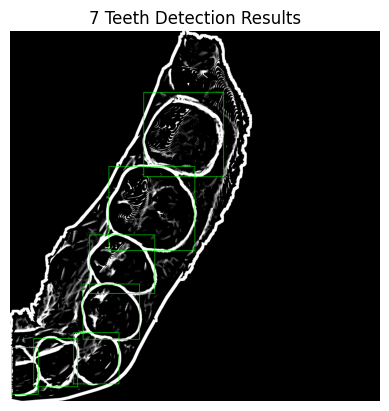


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\115.png: 640x640 7 tooths, 34.2ms
Speed: 3.0ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 115


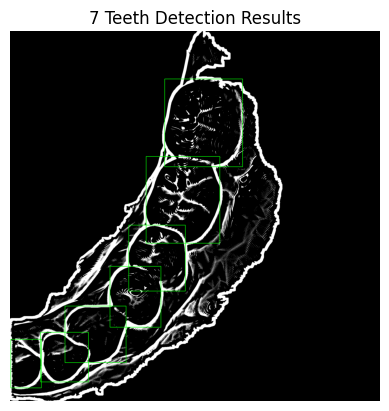


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\116.png: 640x640 7 tooths, 38.6ms
Speed: 3.0ms preprocess, 38.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 116


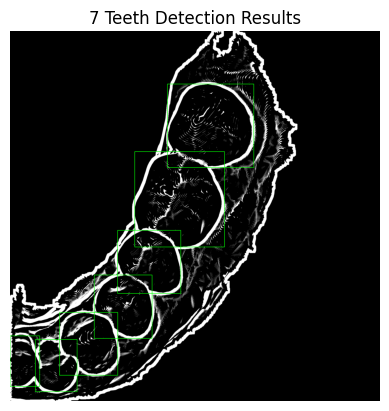


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\117.png: 640x640 8 tooths, 36.0ms
Speed: 3.0ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 117


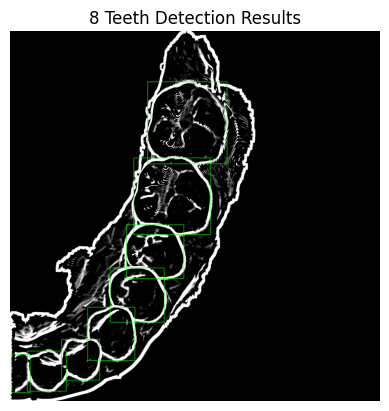


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\118.png: 640x640 7 tooths, 35.8ms
Speed: 3.0ms preprocess, 35.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 118


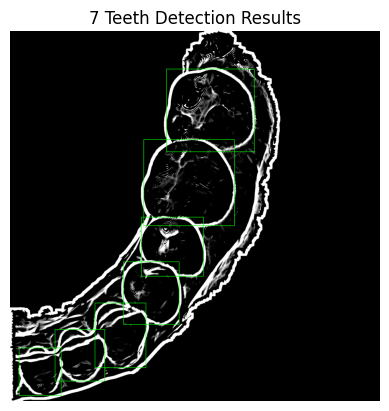


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\119.png: 640x640 7 tooths, 38.3ms
Speed: 2.0ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 119


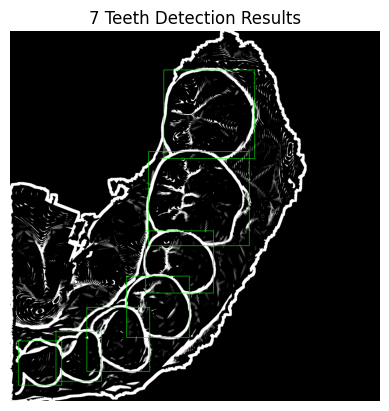


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\120.png: 640x640 7 tooths, 37.9ms
Speed: 3.0ms preprocess, 37.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 120


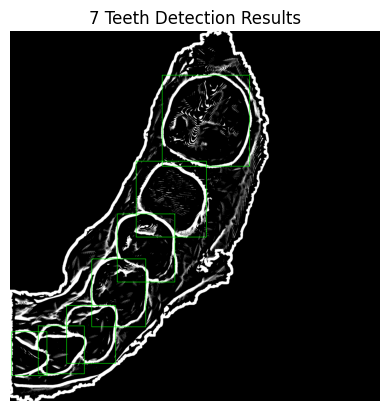


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\121.png: 640x640 7 tooths, 42.6ms
Speed: 4.0ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 121


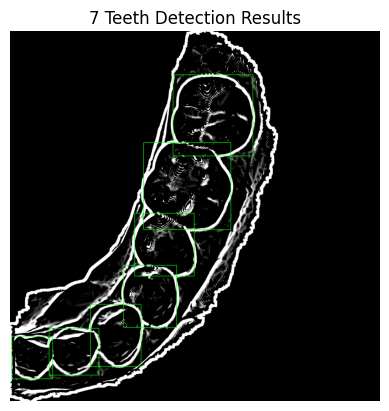


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\123.png: 640x640 7 tooths, 41.3ms
Speed: 3.0ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 123


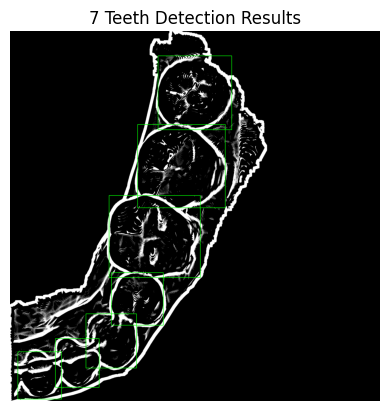


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\124.png: 640x640 7 tooths, 41.5ms
Speed: 3.2ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 124


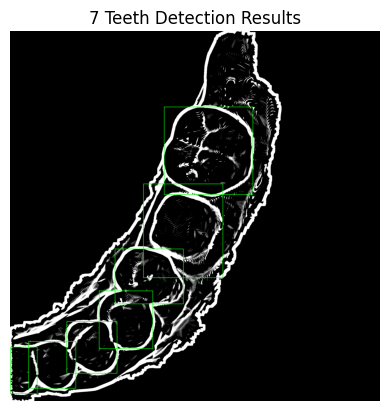


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\125.png: 640x640 8 tooths, 37.9ms
Speed: 4.0ms preprocess, 37.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 125


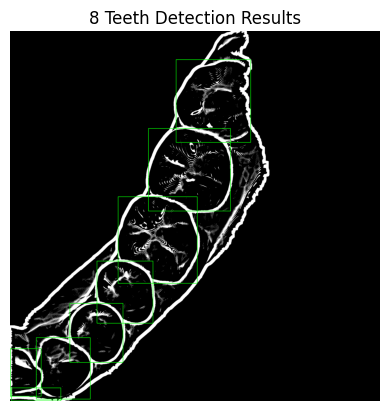


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\126.png: 640x640 7 tooths, 42.3ms
Speed: 2.5ms preprocess, 42.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 126


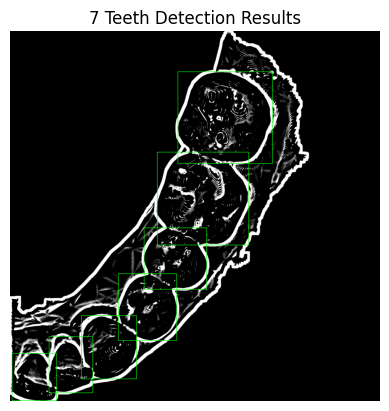


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\127.png: 640x640 7 tooths, 38.5ms
Speed: 3.0ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 127


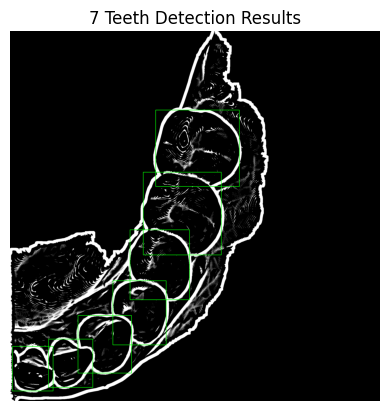


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\128.png: 640x640 8 tooths, 40.5ms
Speed: 3.0ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 128


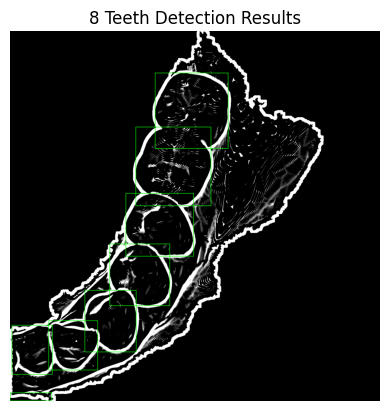


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\129.png: 640x640 7 tooths, 36.2ms
Speed: 3.0ms preprocess, 36.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Processing 129


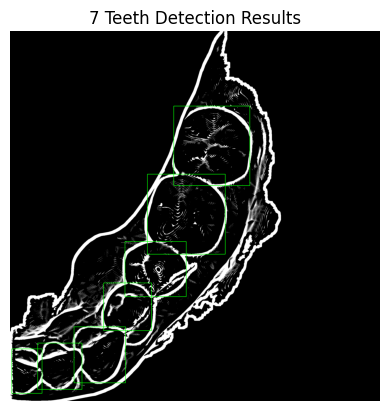


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\130.png: 640x640 7 tooths, 39.2ms
Speed: 2.0ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 130


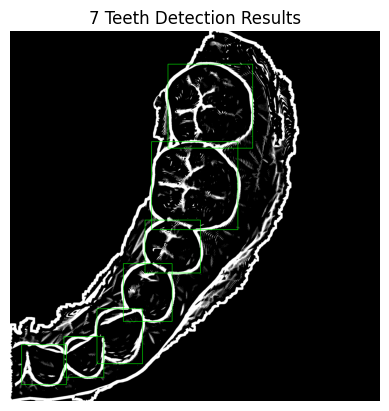


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\131.png: 640x640 7 tooths, 42.2ms
Speed: 3.5ms preprocess, 42.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Processing 131


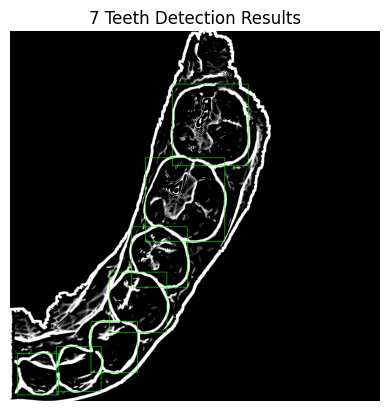


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\132.png: 640x640 7 tooths, 39.5ms
Speed: 3.0ms preprocess, 39.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 132


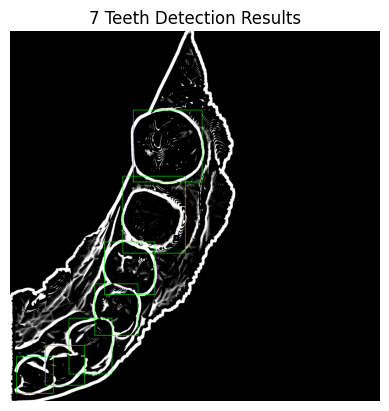


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\133.png: 640x640 7 tooths, 40.6ms
Speed: 2.2ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 133


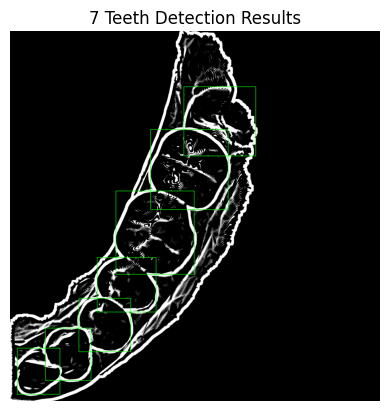


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\134.png: 640x640 7 tooths, 42.0ms
Speed: 3.3ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 134


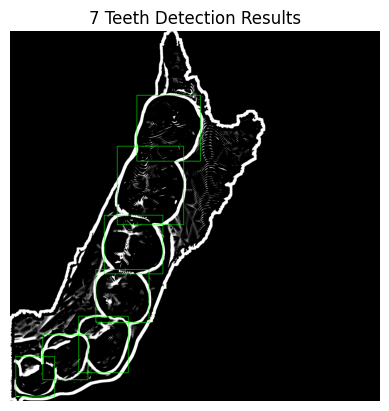


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\135.png: 640x640 7 tooths, 36.6ms
Speed: 3.0ms preprocess, 36.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Processing 135


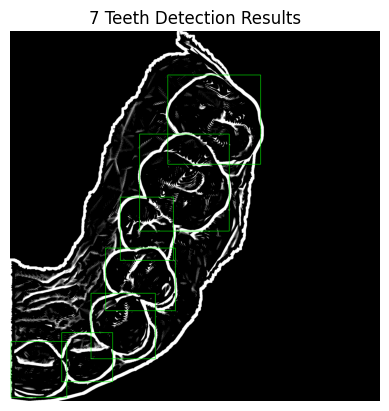


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\136.png: 640x640 7 tooths, 40.0ms
Speed: 3.3ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 136


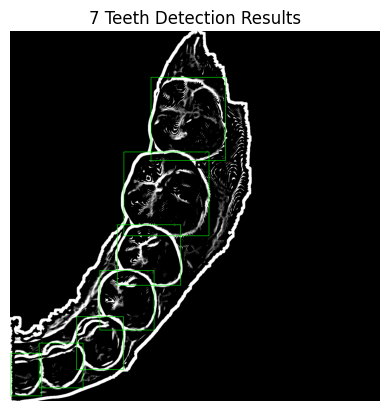


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\137.png: 640x640 7 tooths, 39.0ms
Speed: 3.0ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 137


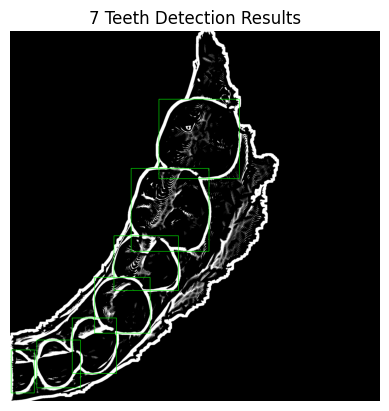


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\138.png: 640x640 7 tooths, 40.1ms
Speed: 3.0ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 138


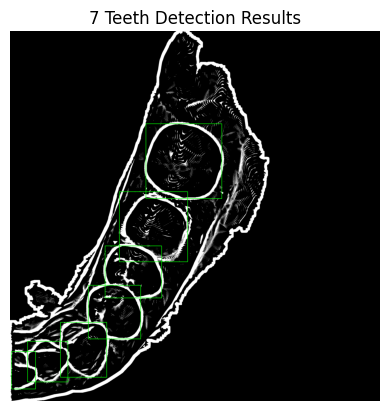


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\139.png: 640x640 7 tooths, 42.5ms
Speed: 3.0ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 139


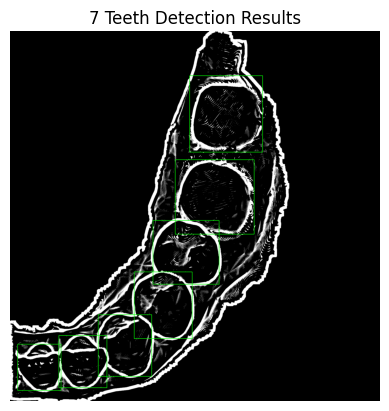


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\140.png: 640x640 7 tooths, 43.6ms
Speed: 2.4ms preprocess, 43.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Processing 140


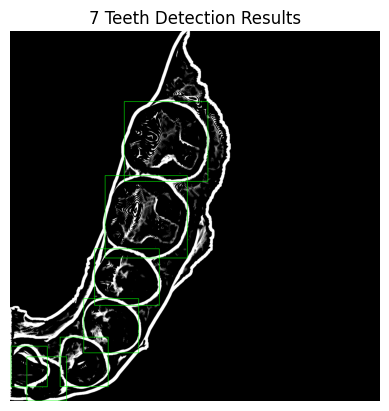


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\141.png: 640x640 7 tooths, 38.0ms
Speed: 3.0ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 141


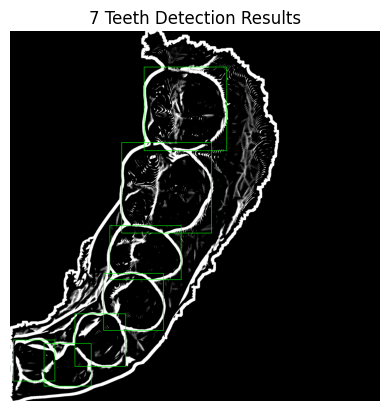


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\142.png: 640x640 7 tooths, 34.9ms
Speed: 5.0ms preprocess, 34.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 142


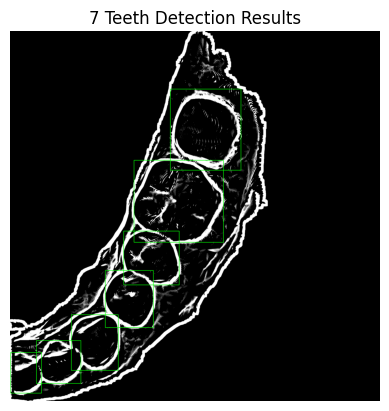


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\143.png: 640x640 7 tooths, 38.3ms
Speed: 2.7ms preprocess, 38.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 143


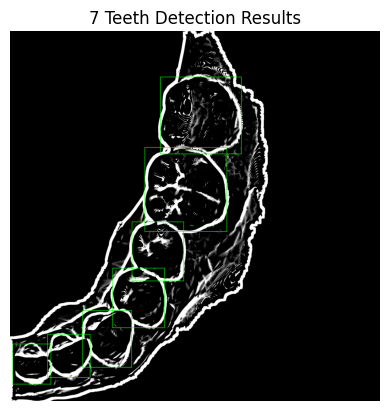


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\144.png: 640x640 7 tooths, 36.5ms
Speed: 3.9ms preprocess, 36.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 144


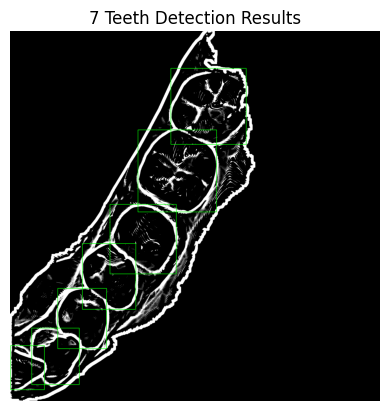


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\145.png: 640x640 7 tooths, 39.0ms
Speed: 3.5ms preprocess, 39.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 145


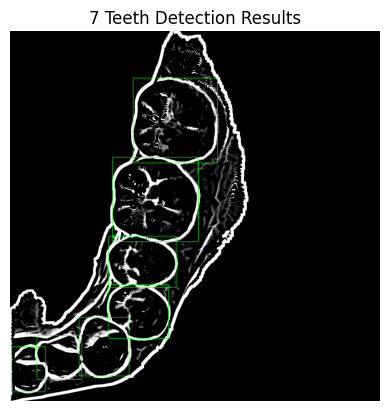


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\146.png: 640x640 9 tooths, 41.0ms
Speed: 3.0ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 146


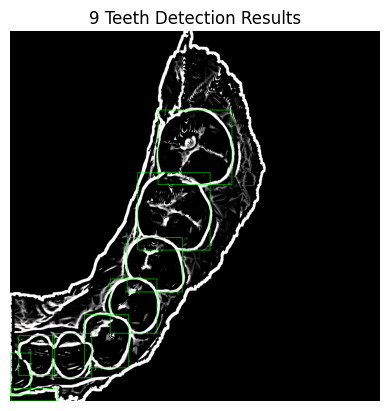


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\91.png: 640x640 8 tooths, 38.0ms
Speed: 3.3ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 91


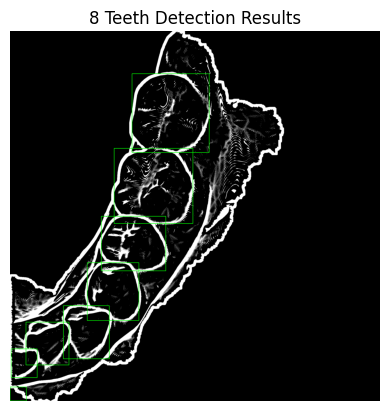


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\92.png: 640x640 7 tooths, 42.0ms
Speed: 3.1ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 92


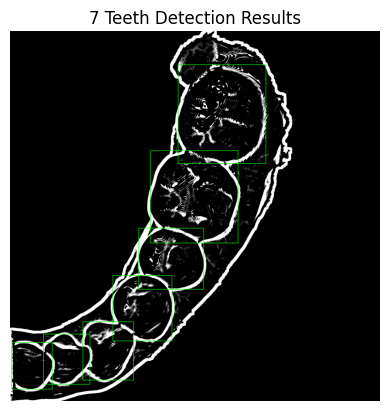


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\93.png: 640x640 7 tooths, 41.1ms
Speed: 3.6ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 93


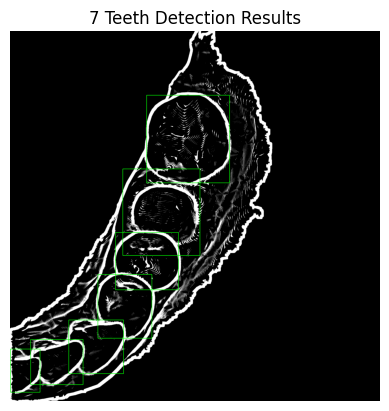


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\94.png: 640x640 7 tooths, 44.3ms
Speed: 3.0ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 94


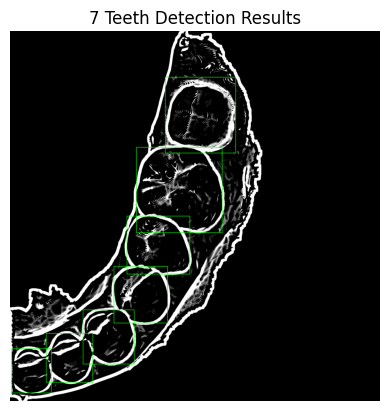


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\95.png: 640x640 7 tooths, 40.1ms
Speed: 2.0ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 95


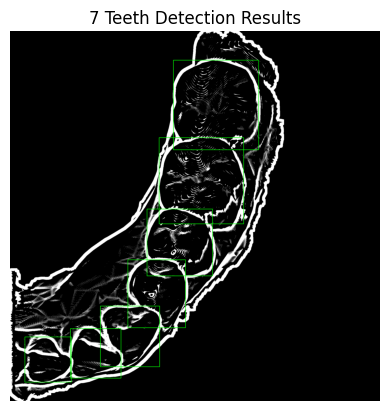


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\96.png: 640x640 7 tooths, 36.5ms
Speed: 3.0ms preprocess, 36.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 96


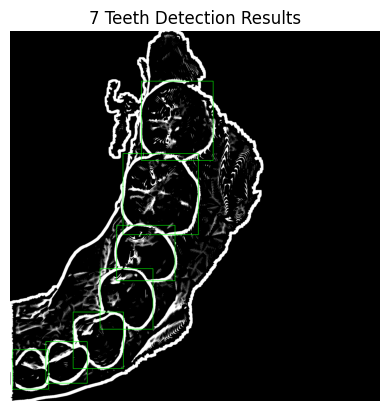


image 1/1 D:\Code\VisualLabExperiment\src\Python\test_img\97.png: 640x640 7 tooths, 44.0ms
Speed: 3.0ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Processing 97


KeyboardInterrupt: 

In [9]:
from ultralytics import YOLO
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

def find_png_files(directory):
    """查找指定目录及其子目录下所有的.png文件"""
    png_files = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.png'):
                png_files.append(os.path.join(root, file))
    return png_files

# 指定要搜索的目录
directory_path = 'test_img'
output_path = 'teeth_detection_result'
if not os.path.exists(output_path):
    os.mkdir(output_path)
png_files = find_png_files(directory_path)
print(png_files)
model = YOLO('./best_contour_0514.pt')
combine_img_path = 'combine_images'
for img_path in png_files:
    # Image
    # Inference
    results = model.predict(img_path)
    img_name = img_path.split('.')[0].split('\\')[1]
    print("Processing {}".format(img_name))
    
    # Loop through each result in your results list
    for result in results:
        # Assuming 'result.orig_img' is a numpy array; convert if needed
        img = result.orig_img.copy()
        # if isinstance(img, torch.Tensor):  # Convert if the image is a tensor
        #     img = img.numpy()
        #     if img.dtype != np.uint8:
        #         img = (img * 255).astype(np.uint8)
        
        # Get the bounding box data from the 'boxes' attribute of the result
        boxes = result.boxes.xyxy

        img_to_combine_path = os.path.join(combine_img_path, img_name + '.png')
        to_combine_img = None
        if os.path.exists(img_to_combine_path):
            to_combine_img = cv2.imread(img_to_combine_path, cv2.IMREAD_GRAYSCALE)
        # Loop through each box and draw it on the image
        for box in boxes:
            # Ensure box is a numpy array for easy handling
            if isinstance(box, torch.Tensor):
                box = box.numpy()  # Convert tensor to numpy array if necessary
            
            x1, y1 = int(box[0]), int(box[1])
            x2, y2 = int(box[2]), int(box[3])
            
            # Draw rectangle on the image
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            if not to_combine_img is None:
                cv2.rectangle(to_combine_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                
        # Convert BGR to RGB for displaying with matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        output_contour_img_path = os.path.join(output_path, '{}_predict.png'.format(img_name))
        output_combined_img_path = os.path.join(output_path, '{}_combined.png'.format(img_name))
        
        cv2.imwrite(output_contour_img_path, img_rgb)
        if not to_combine_img is None:
            cv2.imwrite(output_combined_img_path, to_combine_img)
            
        # Display the image with bounding boxes
        plt.imshow(img_rgb)
        plt.title("{} Teeth Detection Results".format(len(boxes)))
        plt.axis('off')
        plt.show()
        

In [1]:
!pip show ultralytics

ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3109, in _dep_map
    return self.__dep_map
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2902, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3100, in _parsed_pkg_info
    return self._pkg_info
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2902, in __getattr__
    raise AttributeError(attr)
AttributeError: _pkg_info

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users

In [2]:
!pip show opencv-python

ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3109, in _dep_map
    return self.__dep_map
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2902, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3100, in _parsed_pkg_info
    return self._pkg_info
  File "C:\Users\DYPro\.conda\envs\NewMeshSegNet\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2902, in __getattr__
    raise AttributeError(attr)
AttributeError: _pkg_info

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users

In [7]:
import open3d

ModuleNotFoundError: No module named 'open3d'

In [8]:
import trimesh

ModuleNotFoundError: No module named 'trimesh'

In [1]:
import struct

In [6]:
import struct
from stl import mesh

def read_stl_with_color(file_path):
    faces = []
    with open(file_path, 'rb') as f:
        header = f.read(80)  # 跳过头部80字节
        num_faces = struct.unpack('<I', f.read(4))[0]  # 读取面的数量
        print(f"Number of faces: {num_faces}")

        for i in range(num_faces):
            # 读取面的法向量
            normal = struct.unpack('<3f', f.read(12))
            # 读取三个顶点
            vertices = [struct.unpack('<3f', f.read(12)) for _ in range(3)]
            # 读取颜色数据
            attr_byte_count = struct.unpack('<H', f.read(2))[0]

            if not attr_byte_count == 0:  # 检查最高位是否设置，判断是否有颜色信息
                # 从属性字节中解码颜色信息
                red = (attr_byte_count & 0x1F) << 3
                green = ((attr_byte_count >> 5) & 0x1F) << 3
                blue = ((attr_byte_count >> 10) & 0x1F) << 3
                color = (red, green, blue)
            else:
                color = (255, 255, 255)  # 如果没有颜色信息，默认为白色

            faces.append((normal, vertices, color))

    return faces

def write_ascii_stl(faces, output_path):
    with open(output_path, 'w') as f:
        f.write('solid ascii\n')
        for i, (normal, vertices, color) in enumerate(faces):
            f.write(f'  facet normal {normal[0]} {normal[1]} {normal[2]}\n')
            f.write('    outer loop\n')
            for vertex in vertices:
                f.write(f'      vertex {vertex[0]} {vertex[1]} {vertex[2]}\n')
            f.write('    endloop\n')
            f.write('  endfacet\n')
        f.write('endsolid ascii\n')

# 读取STL文件
file_path = 'Crown.stl'
faces = read_stl_with_color(file_path)

# 将信息保存到ASCII格式的STL文件
output_path = 'Crown_ascii.stl'
write_ascii_stl(faces, output_path)


Number of faces: 41652


In [2]:
from stl import mesh
import struct

def read_stl_with_color(file_path):
    with open(file_path, 'rb') as f:
        header = f.read(80)  # 读取头部
        num_faces = struct.unpack('<I', f.read(4))[0]  # 读取面的数量
        print(f"Number of faces: {num_faces}")

        for i in range(num_faces):
            # 读取面的法向量
            normal = struct.unpack('<3f', f.read(12))
            # 读取三个顶点
            vertices = [struct.unpack('<3f', f.read(12)) for _ in range(3)]
            # 读取颜色数据
            attr_byte_count = struct.unpack('<H', f.read(2))[0]

            if attr_byte_count == 0:
                color = (255, 255, 255)  # 如果没有颜色信息，默认白色
            else:
                # 读取颜色信息 (attr_byte_count 为2字节)
                packed_color = struct.unpack('<H', struct.pack('<H', attr_byte_count))[0]
                red = (packed_color & 0x1F) << 3
                green = ((packed_color >> 5) & 0x1F) << 3
                blue = ((packed_color >> 10) & 0x1F) << 3
                color = (red, green, blue)

            print(f"Face {i}:")
            print(f"  Normal: {normal}")
            print(f"  Vertices: {vertices}")
            print(f"  Color: {color}")

# 替换为你的STL文件路径
read_stl_with_color('Crown.stl')



IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Face 33913:
  Normal: (0.2948490381240845, 0.8084822297096252, -0.5093333721160889)
  Vertices: [(-4.216907501220703, 19.071874618530273, -5.727236270904541), (-4.327473163604736, 18.968515396118164, -5.955307483673096), (-4.388725757598877, 19.21115493774414, -5.605616092681885)]
  Color: (8, 0, 56)
Face 33914:
  Normal: (-0.4396742582321167, -0.4440818428993225, 0.7806905508041382)
  Vertices: [(-8.6831636428833, 17.274742126464844, -0.8800550699234009), (-8.813413619995117, 17.40013313293457, -0.8820836544036865), (-8.821941375732422, 17.30537223815918, -0.9407894015312195)]
  Color: (8, 0, 56)
Face 33915:
  Normal: (-0.4060939848423004, 0.7882998585700989, -0.4622456431388855)
  Vertices: [(-7.498407363891602, 19.060630798339844, -6.604401588439941), (-7.703632831573486, 18.97933578491211, -6.562744140625), (-7.600775718688965, 19.067333221435547, -6.50303840637207)]
  Color: (8, 0, 56)
Face 33916:
  Normal: (-0.004851458594202995, 0.5384183526039124, -0.8426637649536133)
  Vertice

In [10]:
import torch
torch.__version__

'2.3.0+cpu'

In [5]:
for i in range(1, 359):
    print('"{:04}",'.format(i))

"0001",
"0002",
"0003",
"0004",
"0005",
"0006",
"0007",
"0008",
"0009",
"0010",
"0011",
"0012",
"0013",
"0014",
"0015",
"0016",
"0017",
"0018",
"0019",
"0020",
"0021",
"0022",
"0023",
"0024",
"0025",
"0026",
"0027",
"0028",
"0029",
"0030",
"0031",
"0032",
"0033",
"0034",
"0035",
"0036",
"0037",
"0038",
"0039",
"0040",
"0041",
"0042",
"0043",
"0044",
"0045",
"0046",
"0047",
"0048",
"0049",
"0050",
"0051",
"0052",
"0053",
"0054",
"0055",
"0056",
"0057",
"0058",
"0059",
"0060",
"0061",
"0062",
"0063",
"0064",
"0065",
"0066",
"0067",
"0068",
"0069",
"0070",
"0071",
"0072",
"0073",
"0074",
"0075",
"0076",
"0077",
"0078",
"0079",
"0080",
"0081",
"0082",
"0083",
"0084",
"0085",
"0086",
"0087",
"0088",
"0089",
"0090",
"0091",
"0092",
"0093",
"0094",
"0095",
"0096",
"0097",
"0098",
"0099",
"0100",
"0101",
"0102",
"0103",
"0104",
"0105",
"0106",
"0107",
"0108",
"0109",
"0110",
"0111",
"0112",
"0113",
"0114",
"0115",
"0116",
"0117",
"0118",
"0119",
"0120",
"0121",
"0122",
"0123",
"0124",
"0125",
